# Milan's Airbnb Market:Concentration, Professionalization, and Housing Displacement


## Research question

To what extent are the concentration and typology of Airbnb listings redefining housing pressure and inequalities among Milan's neighborhoods?

The notebook prepares territorial datasets compatible with Datawrapper.

In [1]:
from pathlib import Path
import unicodedata
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_theme(style='whitegrid', context='notebook')
DATA_DIR = Path.cwd() if Path('listings.csv').exists() else Path('Milano')
df = pd.read_csv(DATA_DIR / 'listings.csv')
reviews = pd.read_csv(DATA_DIR / 'reviews.csv', parse_dates=['date'])
print(f'Listings: {len(df):,}; reviews: {len(reviews):,}')

Listings: 25,790; reviews: 1,148,401


## 1. Data import and column verification

Let's check dimensions, data types, geographic coordinates, and variables needed for the analysis.

In [2]:
required_columns = [
    "id",
    "name",
    "neighbourhood",
    "room_type",
    "price",
    "latitude",
    "longitude",
    "calculated_host_listings_count",
    "number_of_reviews_ltm",
    "availability_365",
    "reviews_per_month",
    "last_review"
]

available_columns = [column for column in required_columns if column in df.columns]
missing_columns = [column for column in required_columns if column not in df.columns]

print("Available variables:", available_columns)
print("Missing variables:", missing_columns)

display(df[available_columns].head())
display(df[available_columns].dtypes)
display(df[["latitude", "longitude"]].describe())

Available variables: ['id', 'name', 'neighbourhood', 'room_type', 'price', 'latitude', 'longitude', 'calculated_host_listings_count', 'number_of_reviews_ltm', 'availability_365', 'reviews_per_month', 'last_review']
Missing variables: []


,id,name,neighbourhood,room_type,price,latitude,longitude,calculated_host_listings_count,number_of_reviews_ltm,availability_365,reviews_per_month,last_review
0,23986,""" Characteristic Milanese flat""",NAVIGLI,Entire home/apt,197.0,45.448060,9.173730,1.0,0,362,0.15,2024-04-20
1,40470,Giacinto Cosy & clean flat near MM1,VIALE MONZA,Entire home/apt,137.0,45.520230,9.227470,2.0,1,236,0.23,2025-07-31
2,46536,Nico & Cinzia's Pink Suite!,VIALE MONZA,Entire home/apt,109.0,45.522760,9.224780,1.0,1,81,0.23,2026-01-04
3,84741,Nice room with private bathroom,PARCO FORLANINI - ORTICA,Private room,27.0,45.469994,9.244106,3.0,18,120,3.79,2026-06-04
4,88130,Great comfortable & quite APT. x 4 people!,VILLAPIZZONE,Entire home/apt,113.0,45.497640,9.145330,1.0,0,363,0.04,2022-10-01


id                                  int64
name                               object
neighbourhood                      object
room_type                          object
price                             float64
latitude                          float64
longitude                         float64
calculated_host_listings_count    float64
number_of_reviews_ltm               int64
availability_365                    int64
reviews_per_month                 float64
last_review                        object
dtype: object

,latitude,longitude
count,25790.000000,25790.000000
mean,45.471356,9.187761
std,0.020505,0.029574
min,45.397080,9.060980
25%,45.455000,9.170250
50%,45.471091,9.188190
75%,45.486516,9.209551
max,45.535420,9.274540


## 2. Data cleaning and outlier management

We remove unnecessary columns, handle missing values, convert dates, and limit price outliers using the 99th percentile.

In [3]:
df_clean = df.copy()

unused_columns = [
    column for column in ["neighbourhood_group"]
    if column in df_clean.columns
]
df_clean = df_clean.drop(columns=unused_columns)

numeric_columns = [
    "price",
    "latitude",
    "longitude",
    "calculated_host_listings_count",
    "number_of_reviews_ltm",
    "availability_365",
    "reviews_per_month"
]

for column in numeric_columns:
    if column in df_clean.columns:
        df_clean[column] = pd.to_numeric(df_clean[column], errors="coerce")

df_clean["reviews_per_month"] = df_clean["reviews_per_month"].fillna(0)
df_clean["number_of_reviews_ltm"] = df_clean["number_of_reviews_ltm"].fillna(0)
df_clean["availability_365"] = df_clean["availability_365"].fillna(0)
df_clean["last_review"] = pd.to_datetime(
    df_clean["last_review"],
    errors="coerce"
)

df_clean = df_clean.dropna(
    subset=[
        "price",
        "latitude",
        "longitude",
        "calculated_host_listings_count"
    ]
)

df_clean = df_clean[df_clean["price"].ge(20)]

p99_price = df_clean["price"].quantile(0.99)
df_clean = df_clean[df_clean["price"].le(p99_price)]

print(f"99th percentile threshold: {p99_price:.2f} euro")
print(f"Dimensions after cleaning: {df_clean.shape}")

99th percentile threshold: 1012.05 euro
Dimensions after cleaning: (22631, 18)


## 3. Creation of analytical variables

Let's create indicators for accommodation type, host professionalization, recent activity, price bracket, and review intensity.

In [4]:
df_clean["is_entire_home"] = (
    df_clean["room_type"].eq("Entire home/apt")
).astype(int)

df_clean["is_professional_host"] = (
    df_clean["calculated_host_listings_count"].ge(5)
).astype(int)

df_clean["host_profile_type"] = np.select(
    [
        df_clean["calculated_host_listings_count"].eq(1),
        df_clean["calculated_host_listings_count"].between(2, 4)
    ],
    [
        "Single owner",
        "Medium multi-host"
    ],
    default="Professional or agency"
)

df_clean["is_actively_rented"] = (
    df_clean["number_of_reviews_ltm"].gt(0)
    & df_clean["availability_365"].gt(0)
).astype(int)

price_bins = [0, 80, 150, 250, np.inf]
price_labels = [
    "Budget",
    "Medium",
    "High",
    "Luxury"
]

df_clean["price_bracket"] = pd.cut(
    df_clean["price"],
    bins=price_bins,
    labels=price_labels,
    right=False
)

df_clean["review_intensity"] = pd.cut(
    df_clean["number_of_reviews_ltm"],
    bins=[-1, 0, 5, 15, np.inf],
    labels=["None", "Low", "Medium", "High"]
)

display(df_clean.head())

,id,name,host_id,host_profile_id,host_name,neighbourhood,latitude,longitude,room_type,price,...,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,is_entire_home,is_professional_host,host_profile_type,is_actively_rented,price_bracket,review_intensity
0,23986,""" Characteristic Milanese flat""",95941.0,1.462509e+18,Jeremy,NAVIGLI,45.448060,9.173730,Entire home/apt,197.0,...,1.0,362,0,NaN,1,0,Single owner,0,High,None
1,40470,Giacinto Cosy & clean flat near MM1,174203.0,1.462512e+18,Giacinto,VIALE MONZA,45.520230,9.227470,Entire home/apt,137.0,...,2.0,236,1,IT015146C2YDCLSU8G,1,0,Medium multi-host,1,Medium,Low
2,46536,Nico & Cinzia's Pink Suite!,138683.0,1.462511e+18,Nico&Cinzia,VIALE MONZA,45.522760,9.224780,Entire home/apt,109.0,...,1.0,81,1,IT015209C2BBKGCMT7,1,0,Single owner,1,Medium,Low
3,84741,Nice room with private bathroom,443989.0,1.462512e+18,Franci,PARCO FORLANINI - ORTICA,45.469994,9.244106,Private room,27.0,...,3.0,120,18,"I applied for a CIN, but haven’t received it yet",0,0,Medium multi-host,1,Budget,High
4,88130,Great comfortable & quite APT. x 4 people!,481475.0,1.462519e+18,Cinzia,VILLAPIZZONE,45.497640,9.145330,Entire home/apt,113.0,...,1.0,363,0,NaN,1,0,Single owner,0,Medium,None


## 4. Aggregation of metrics by neighborhood

Let's calculate absolute and percentage indicators at the neighborhood level.

In [5]:
 # 1. Retrieve the list of all 88 original neighborhoods BEFORE filters
all_neighbourhoods = df["neighbourhood"].unique()

# Transform the column into a fixed category that does not "forget" neighborhoods
df_clean["neighbourhood"] = pd.Categorical(
    df_clean["neighbourhood"], 
    categories=all_neighbourhoods
)

# 2. Update the function by adding "observed=False" and ".fillna(0)"
def compute_metrics(df, group_col):
    res = (
        df.groupby(group_col, dropna=False, observed=False)
        .agg(
            total_listings=("id", "count"),
            entire_homes=("is_entire_home", "sum"),
            perc_entire_homes=("is_entire_home", "mean"),
            median_price=("price", "median"),
            mean_price=("price", "mean"),
            professional_listings=("is_professional_host", "sum"),
            perc_professional_hosts=("is_professional_host", "mean"),
            total_reviews_ltm=("number_of_reviews_ltm", "sum"),
            mean_reviews_ltm=("number_of_reviews_ltm", "mean"),
            active_listings=("is_actively_rented", "sum")
        )
        .reset_index()
    )
    
    # Multiply percentages by 100
    res["perc_entire_homes"] *= 100
    res["perc_professional_hosts"] *= 100
    
    # Remove Category format to avoid errors and replace NaNs with 0
    res[group_col] = res[group_col].astype(str)
    res = res.fillna(0)
    
    return res.sort_values("total_listings", ascending=False)

# 3. Recalculate metrics
neighbourhood_metrics = compute_metrics(df_clean, "neighbourhood")

# 4. Verify that Cascina Triulza is present with values at 0
display(neighbourhood_metrics[neighbourhood_metrics["neighbourhood"] == "CASCINA TRIULZA - EXPO"])

,neighbourhood,total_listings,entire_homes,perc_entire_homes,median_price,mean_price,professional_listings,perc_professional_hosts,total_reviews_ltm,mean_reviews_ltm,active_listings
87,CASCINA TRIULZA - EXPO,0,0,0.0,0.0,0.0,0,0.0,0,0.0,0


## 5. Integration with geographic boundaries

Let's load a GeoJSON of the neighborhoods or NILs and verify the correspondence with the aggregated data.

In [6]:
def normalize_text(value):
    if pd.isna(value):
        return ""
    value = str(value).strip().lower()
    value = unicodedata.normalize("NFKD", value)
    return "".join(
        character for character in value
        if not unicodedata.combining(character)
    )

geojson_candidates = list(DATA_DIR.glob("*.geojson"))
geojson_candidates += list(DATA_DIR.glob("*.json"))

geo_path = geojson_candidates[0] if geojson_candidates else None

if geo_path is not None:
    import geopandas as gpd

    gdf = gpd.read_file(geo_path)

    possible_name_columns = [
        "neighbourhood",
        "NIL",
        "nil",
        "nome",
        "name",
        "NAME"
    ]

    geo_name_column = next(
        (
            column for column in possible_name_columns
            if column in gdf.columns
        ),
        None
    )

    if geo_name_column is None:
        raise ValueError("No identifiable geographic column in the GeoJSON")

    gdf["geo_name"] = gdf[geo_name_column].astype(str)
    gdf["join_key"] = gdf["geo_name"].map(normalize_text)

    neighbourhood_metrics["join_key"] = (
        neighbourhood_metrics["neighbourhood"]
        .map(normalize_text)
    )

    gdf_enriched = gdf.merge(
        neighbourhood_metrics,
        on="join_key",
        how="left"
    )

    unmatched_data = set(
        neighbourhood_metrics["join_key"]
    ) - set(gdf["join_key"])

    unmatched_geo = set(
        gdf["join_key"]
    ) - set(neighbourhood_metrics["join_key"])

    print(f"Neighborhoods without geometry: {len(unmatched_data)}")
    print(f"Geometries without data: {len(unmatched_geo)}")
else:
    gdf = None
    gdf_enriched = None
    print("GeoJSON not found in data folder.")

Neighborhoods without geometry: 0
Geometries without data: 0


## 6. Dataset preparation for Symbol Map

Let's select the necessary variables to represent individual listings on Datawrapper.

In [7]:
symbol_columns = [
    "id",
    "name",
    "latitude",
    "longitude",
    "neighbourhood",
    "room_type",
    "price",
    "host_profile_type",
    "calculated_host_listings_count",
    "number_of_reviews_ltm",
    "price_bracket",
    "is_entire_home",
    "is_professional_host",
    "is_actively_rented"
]

symbol_map_df = df_clean[
    [column for column in symbol_columns if column in df_clean.columns]
].copy()

symbol_map_df["price"] = symbol_map_df["price"].round(1)

from pathlib import Path

# Define only "output" in the current folder
OUTPUT_DIR = Path("output") 

# Create directory if it doesn't exist
OUTPUT_DIR.mkdir(exist_ok=True) 

symbol_map_path = OUTPUT_DIR / "airbnb_milan_symbol_map.csv"
symbol_map_df.to_csv(symbol_map_path, index=False)

print(f"File created: {symbol_map_path}")

File created: output/airbnb_milan_symbol_map.csv


## 7. Dataset preparation for Choropleth Map

Let's export a territorial table with geographic identifier, absolute values, and percentages.

In [8]:
choropleth_df = neighbourhood_metrics.copy()

choropleth_df["median_price"] = (
    choropleth_df["median_price"].round(1)
)

choropleth_df["mean_price"] = (
    choropleth_df["mean_price"].round(1)
)

choropleth_df["mean_reviews_ltm"] = (
    choropleth_df["mean_reviews_ltm"].round(1)
)

choropleth_columns = [
    "neighbourhood",
    "join_key",
    "total_listings",
    "entire_homes",
    "perc_entire_homes",
    "median_price",
    "mean_price",
    "professional_listings",
    "perc_professional_hosts",
    "total_reviews_ltm",
    "mean_reviews_ltm",
    "active_listings"
]

choropleth_df = choropleth_df[choropleth_columns]

choropleth_path = OUTPUT_DIR / "airbnb_milan_choropleth_neighborhoods.csv"
choropleth_df.to_csv(choropleth_path, index=False)

print(f"File created: {choropleth_path}")

File created: output/airbnb_milan_choropleth_neighborhoods.csv


## 8. Quality checks and exploratory visualizations

Let's check for duplicates, anomalous coordinates, missing neighborhoods, and metric distributions.

In [9]:
# 1. Check duplicates and null values
duplicate_count = df_clean["id"].duplicated().sum()
missing_neighbourhood = df_clean["neighbourhood"].isna().sum()

# 2. Check that coordinates fall within Milan's urban area bounds
milan_bounds = (
    df_clean["latitude"].between(45.38, 45.54) &
    df_clean["longitude"].between(9.04, 9.28)
)

print(f"Duplicate IDs: {duplicate_count}")
print(f"Missing neighborhoods: {missing_neighbourhood}")
print(f"Listings within Milan boundaries: {milan_bounds.sum():,} out of {len(df_clean):,}")

Duplicate IDs: 0
Missing neighborhoods: 0
Listings within Milan boundaries: 22,631 out of 22,631


Duplicates: 0
Missing neighborhoods: 0
Coordinates out of bounds: 0


/var/folders/cb/l119vpqj3h3_mh82szqqb1080000gn/T/ipykernel_79831/425101349.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


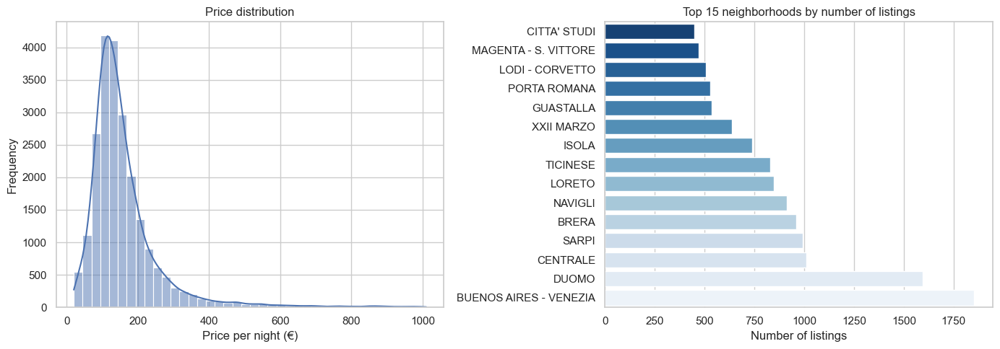

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Data quality checks
duplicate_count = df_clean["id"].duplicated().sum()
missing_neighbourhood = df_clean["neighbourhood"].isna().sum()

# Valid geographic coordinates for the metropolitan area of Milan
valid_coordinates = (
    df_clean["latitude"].between(45.35, 45.60)
    & df_clean["longitude"].between(9.00, 9.35)
)

print(f"Duplicates: {duplicate_count}")
print(f"Missing neighborhoods: {missing_neighbourhood}")
print(f"Coordinates out of bounds: {(~valid_coordinates).sum()}")

# 2. Exploratory visualizations
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Price histogram
sns.histplot(
    data=df_clean,
    x="price",
    bins=40,
    ax=axes[0],
    kde=True
)
axes[0].set_title("Price distribution")
axes[0].set_xlabel("Price per night (€)")
axes[0].set_ylabel("Frequency")

# Top 15 neighborhoods by listing volume
top_neighbourhoods = (
    neighbourhood_metrics
    .nlargest(15, "total_listings")
    .sort_values("total_listings")
)

sns.barplot(
    data=top_neighbourhoods,
    x="total_listings",
    y="neighbourhood",
    ax=axes[1],
    palette="Blues_r"
)
axes[1].set_title("Top 15 neighborhoods by number of listings")
axes[1].set_xlabel("Number of listings")
axes[1].set_ylabel("")

plt.tight_layout()
plt.show()

## 9. File export for Datawrapper

Let's export the final CSVs and, when available, the GeoJSON enriched with territorial metrics.

In [11]:
if gdf_enriched is not None:
    geojson_output = OUTPUT_DIR / "airbnb_milan_quartieri_enriched.geojson"
    gdf_enriched.to_file(
        geojson_output,
        driver="GeoJSON"
    )
    print(f"GeoJSON created: {geojson_output}")

metadata = pd.DataFrame({
    "file": [
        symbol_map_path.name,
        choropleth_path.name
    ],
    "use": [
        "Symbol Map",
        "Choropleth Map"
    ],
    "source": [
        "Inside Airbnb listings.csv",
        "Inside Airbnb listings.csv"
    ],
    "price_filter": [
        "Price at least 20 euros and 99th percentile threshold",
        "Price at least 20 euros and 99th percentile threshold"
    ]
})

metadata_path = OUTPUT_DIR / "datawrapper_metadata.csv"
metadata.to_csv(metadata_path, index=False)

print("Export completed.")
print(f"Output directory: {OUTPUT_DIR}")
display(metadata)

GeoJSON created: output/airbnb_milan_quartieri_enriched.geojson
Export completed.
Output directory: output


,file,use,source,price_filter
0,airbnb_milan_symbol_map.csv,Symbol Map,Inside Airbnb listings.csv,Price at least 20 euros and 99th percentile th...
1,airbnb_milan_choropleth_neighborhoods.csv,Choropleth Map,Inside Airbnb listings.csv,Price at least 20 euros and 99th percentile th...


In [12]:
# Official Neighborhood (NIL) -> District (Municipio) dictionary for Milan
NIL_TO_MUNICIPIO = {
    # District 1 (Historic Center)
    "DUOMO": 1, "BRERA": 1, "MAGENTA - S. VITTORE": 1, "PARCO SEMPIONE": 1,
    "GUASTALLA": 1, "TICINESE": 1, "GIARDINI PORTA VENEZIA": 1,

    # District 2
    "CENTRALE": 2, "LORETO": 2, "TURRO": 2, "CRESCENZAGO": 2, "PADOVA": 2,
    "VIALE MONZA": 2, "GRECO": 2, "ADRIANO": 2, "MAGGIOLINA": 2, "CASCINA GOBBA": 2,

    # District 3
    "CITTA' STUDI": 3, "BUENOS AIRES - VENEZIA": 3, "LAMBRATE": 3,
    "PARCO LAMBRO - CIMIANO": 3, "PARCO FORLANINI - ORTICA": 3,

    # District 4
    "PORTA ROMANA": 4, "XXII MARZO": 4, "UMBRIA - MOLISE": 4, "CORVETTO": 4,
    "ROGOREDO": 4, "MECENATE": 4, "ORTOMERCATO": 4, "CHIARAVALLE": 4,
    "TRIULZO SUPERIORE": 4, "PARCO MONLUE' - PONTE LAMBRO": 4, "CORSICA": 4,
    "LODI - CORVETTO": 4,

    # District 5
    "TIBALDI": 5, "STADERA": 5, "RIPAMONTI": 5, "GRATOSOGLIO - TICINELLO": 5,
    "CHIARAVALLE": 5, "EX OM - MORIVIONE": 5, "QUINTOSOLE": 5, "RONCHETTO DELLE RANE": 5,
    "PARCO DELLE ABBAZIE": 5, "SCALO ROMANA": 5, "VIGENTINA": 5, "CANTALUPA": 5,

    # District 6
    "NAVIGLI": 6, "TORTONA": 6, "BARONA": 6, "LORENTEGGIO": 6, "GIAMBELLINO": 6,
    "S. CRISTOFORO": 6, "RONCHETTO SUL NAVIGLIO": 6, "PARCO DEI NAVIGLI": 6, "PARCO AGRICOLO SUD": 6,

    # District 7
    "DE ANGELI - MONTE ROSA": 7, "BANDE NERE": 7, "WASHINGTON": 7, "S. SIRO": 7,
    "BAGGIO": 7, "FORZE ARMATE": 7, "SELINUNTE": 7, "QUINTO ROMANO": 7,
    "MUGGIANO": 7, "QUARTO CAGNINO": 7,

    # District 8
    "TRE TORRI": 8, "PORTELLO": 8, "PAGANO": 8, "SARPI": 8, "GHISOLFA": 8,
    "VILLAPIZZONE": 8, "MAGGIORE - MUSOCCO": 8, "GALLARATESE": 8, "QT 8": 8,
    "FIGINO": 8, "CASCINA TRIULZA - EXPO": 8, "TRENNO": 8, "PARCO BOSCO IN CITTA'": 8,
    "QUARTO OGGIARO": 8,

    # District 9
    "GARIBALDI REPUBBLICA": 9, "ISOLA": 9, "FARINI": 9, "DERGANO": 9, "BOVISA": 9,
    "AFFORI": 9, "BICOCCA": 9, "NIGUARDA - CA' GRANDA": 9, "BOVISASCA": 9,
    "BRUZZANO": 9, "COMASINA": 9, "PARCO NORD": 9, "MACIACHINI - MAGGIOLINA": 9
}

# Add 'municipio' column to cleaned dataset
df_clean["municipio"] = df_clean["neighbourhood"].map(NIL_TO_MUNICIPIO)

In [13]:
def compute_metrics(df, group_col):
    # If we are grouping by neighborhood, make sure to include all original categories
    # (if group_col is 'neighbourhood', use global categories, otherwise group normally)
    if group_col == "neighbourhood" and 'all_neighbourhoods' in globals():
        df[group_col] = pd.Categorical(df[group_col], categories=all_neighbourhoods)

    res = (
        df.groupby(group_col, dropna=False, observed=False)
        .agg(
            total_listings=("id", "count"),
            entire_homes=("is_entire_home", "sum"),
            perc_entire_homes=("is_entire_home", lambda x: round(x.mean() * 100, 1) if len(x) > 0 and not pd.isna(x.mean()) else 0),
            median_price=("price", lambda x: round(x.median(), 1) if len(x) > 0 and not pd.isna(x.median()) else 0),
            mean_price=("price", lambda x: round(x.mean(), 1) if len(x) > 0 and not pd.isna(x.mean()) else 0),
            professional_listings=("is_professional_host", "sum"),
            perc_professional_hosts=("is_professional_host", lambda x: round(x.mean() * 100, 1) if len(x) > 0 and not pd.isna(x.mean()) else 0),
            total_reviews_ltm=("number_of_reviews_ltm", "sum"),
            mean_reviews_ltm=("number_of_reviews_ltm", lambda x: round(x.mean(), 1) if len(x) > 0 and not pd.isna(x.mean()) else 0),
            active_listings=("is_actively_rented", "sum")
        )
        .reset_index()
    )
    
    # Convert the grouping column to string to avoid type issues with Pandas
    res[group_col] = res[group_col].astype(str)
    
    # Impute any remaining NaNs with 0 across the resulting dataframe
    res = res.fillna(0)
    
    return res.sort_values("total_listings", ascending=False)

# 1. Metrics by Neighborhood (for Choropleth Map with neighbourhoods.geojson)
neighbourhood_metrics = compute_metrics(df_clean, "neighbourhood")
neighbourhood_metrics.to_csv("airbnb_milan_quartieri.csv", index=False)

# 2. Metrics by District (for summary tables or bar charts on Datawrapper)
municipio_metrics = compute_metrics(df_clean, "municipio")
municipio_metrics.to_csv("airbnb_milan_municipi.csv", index=False)

display(municipio_metrics)

,municipio,total_listings,entire_homes,perc_entire_homes,median_price,mean_price,professional_listings,perc_professional_hosts,total_reviews_ltm,mean_reviews_ltm,active_listings
0,1.0,4422,4092,92.5,178.0,210.5,2670,60.4,60982,13.8,3200
1,2.0,2754,2380,86.4,123.0,141.6,1201,43.6,48481,17.6,2112
2,3.0,2541,2237,88.0,136.0,159.3,1185,46.6,35969,14.2,1852
3,4.0,2517,2214,88.0,128.0,145.3,1157,46.0,27040,10.7,1772
8,9.0,2481,2164,87.2,126.0,147.9,990,39.9,32864,13.2,1838
7,8.0,2454,2191,89.3,129.0,150.8,1019,41.5,31996,13.0,1848
5,6.0,2228,1958,87.9,127.5,148.2,928,41.7,25658,11.5,1570
6,7.0,1785,1583,88.7,130.0,153.6,751,42.1,20306,11.4,1281
4,5.0,1433,1262,88.1,120.0,143.9,637,44.5,13123,9.2,973
9,nan,16,10,62.5,108.5,158.5,5,31.2,50,3.1,7


## RQ1 Which neighborhoods record the highest density of entire apartments removed from the long-term residential market?

In [14]:
# 1. Project GeoDataFrame to a metric system (UTM zone 32N: EPSG 32632 for Milan)
gdf_milan = gdf_enriched.to_crs(epsg=32632)

# 2. Calculate area in square kilometers (km²)
gdf_enriched["area_km2"] = gdf_milan.geometry.area / 10**6

# 3. Calculate key metric: Density of entire homes per km²
gdf_enriched["density_entire_homes_km2"] = gdf_enriched["entire_homes"] / gdf_enriched["area_km2"]

# 4. Create ranking of neighborhoods most exposed to touristification
top_pressure = (
    gdf_enriched[
        ["geo_name", "entire_homes", "area_km2", "density_entire_homes_km2", "perc_entire_homes"]
    ]
    .rename(columns={"geo_name": "Neighborhood"})
    .sort_values(by="density_entire_homes_km2", ascending=False)
)

# 5. Display top 15 neighborhoods formatted for readability
print("--- TOP 15 NEIGHBORHOODS BY DENSITY OF ENTIRE HOMES (per km²) ---")
display(
    top_pressure
    .head(15)
    .style.format({
        "area_km2": "{:.2f}",
        "density_entire_homes_km2": "{:.1f}",
        "perc_entire_homes": "{:.1f}%"
    })
    .background_gradient(subset=["density_entire_homes_km2"], cmap="Reds")
)

# 6. Save file for Datawrapper Choropleth Map (including the new metric)
choropleth_final = choropleth_df.merge(
    gdf_enriched[["join_key", "area_km2", "density_entire_homes_km2"]],
    on="join_key",
    how="right"
)

choropleth_final = choropleth_final.fillna(0)
choropleth_final["area_km2"] = choropleth_final["area_km2"].round(2)
choropleth_final["density_entire_homes_km2"] = choropleth_final["density_entire_homes_km2"].round(1)

export_path = OUTPUT_DIR / "airbnb_milan_choropleth_pressure.csv"
choropleth_final.to_csv(export_path, index=False)
print(f"\nFile exported for Datawrapper (Choropleth Map): {export_path.name}")

--- TOP 15 NEIGHBORHOODS BY DENSITY OF ENTIRE HOMES (per km²) ---


,Neighborhood,entire_homes,area_km2,density_entire_homes_km2,perc_entire_homes
36,DUOMO,1491,2.34,636.7,93.5%
81,TICINESE,768,1.26,612.0,92.6%
58,NAVIGLI,843,1.48,568.1,92.3%
60,BUENOS AIRES - VENEZIA,1628,2.88,565.8,87.8%
69,CENTRALE,862,1.56,554.0,85.3%
35,BRERA,905,1.64,552.7,94.4%
75,SARPI,913,1.81,503.9,91.9%
74,ISOLA,663,1.32,501.2,89.7%
84,PORTA ROMANA,495,1.00,493.6,93.8%
71,LORETO,744,1.75,425.7,87.8%



File exported for Datawrapper (Choropleth Map): airbnb_milan_choropleth_pressure.csv


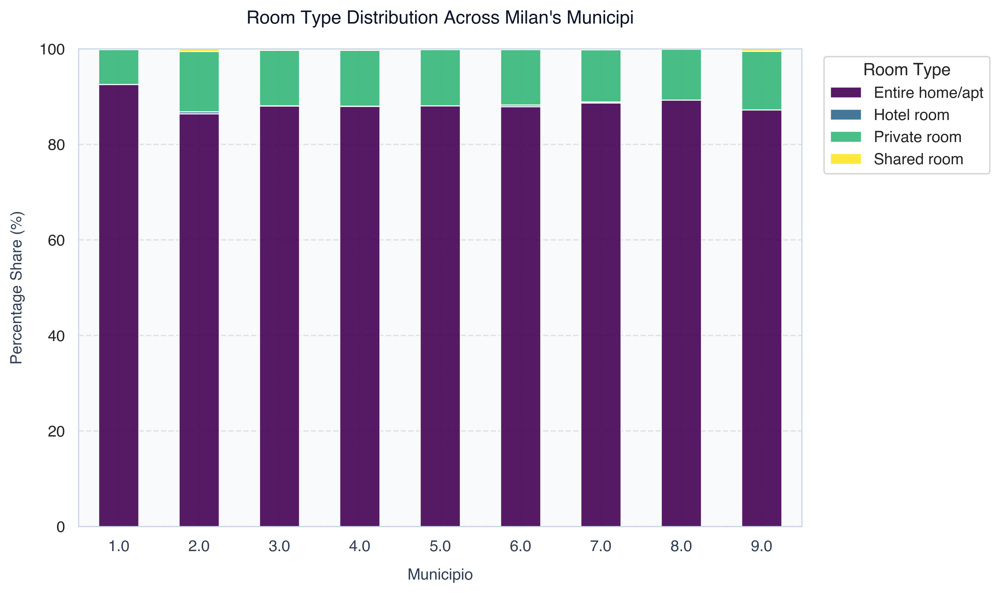

In [15]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib
%config InlineBackend.figure_format = 'retina'

# --- STILE GRAFICO MODERN & CLEAN (SEABORN THEME) ---
sns.set_theme(style="whitegrid", palette="muted")
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Helvetica', 'Arial', 'DejaVu Sans']
plt.rcParams['axes.edgecolor'] = '#cbd5e1'
plt.rcParams['axes.linewidth'] = 0.8
plt.rcParams['grid.linestyle'] = '--'
plt.rcParams['grid.alpha'] = 0.4

if 'df_clean' in globals() and 'municipio' in df_clean.columns and 'room_type' in df_clean.columns:
    
    # 1. Create a crosstab of room types by Municipio
    room_municipio = pd.crosstab(
        df_clean['municipio'], 
        df_clean['room_type'], 
        normalize='index'
    ) * 100  # Convert to percentage
    
    # 2. Configurazione della figura in ALTA DEFINIZIONE (dpi=300)
    fig, ax = plt.subplots(figsize=(10, 6), dpi=300, facecolor='white')
    ax.set_facecolor('#f8fafc') # Sfondo interno delicato
    
    # Plotting stacked bar chart con stile pulito
    room_municipio.plot(
        kind='bar',
        stacked=True,
        ax=ax,
        colormap='viridis',       # Colormap moderna e professionale (alternativa a viridis)
        edgecolor='#ffffff',
        linewidth=0.8,
        alpha=0.9
    )
    
    # 3. Formattazione e stile avanzato
    ax.set_title("Room Type Distribution Across Milan's Municipi", fontsize=13, fontweight='bold', color='#0f172a', pad=18)
    ax.set_xlabel("Municipio", fontsize=11, fontweight='semibold', color='#334155', labelpad=10)
    ax.set_ylabel("Percentage Share (%)", fontsize=11, fontweight='semibold', color='#334155', labelpad=10)
    ax.set_ylim(0, 100)
    ax.grid(axis='y', linestyle='--', alpha=0.5)
    
    # Rotazione e legenda pulita fuori dal grafico
    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, color='#334155', fontweight='semibold')
    
    legend = ax.legend(title="Room Type", bbox_to_anchor=(1.02, 1), loc='upper left', frameon=True, facecolor='white')
    legend.get_title().set_fontweight('bold')
    
    plt.tight_layout()
    plt.show()
else:
    print("Please ensure 'df_clean' is loaded and contains the 'municipio' and 'room_type' columns.")

## RQ2 How do housing prices align with the actual geographic concentration of recent guest activity (reviews) across Milan?"


In [16]:
# Filter neighborhoods with at least 1 listing
valid_neighbourhoods = neighbourhood_metrics[neighbourhood_metrics["total_listings"].ge(1)]

# Top 10 highest median prices (Descending)
price_highest = (
    valid_neighbourhoods
    [[ "neighbourhood", "median_price", "mean_price", "total_listings" ]]
    .sort_values(by="median_price", ascending=False)
)

print("--- TOP 10 HIGHEST NEIGHBORHOODS (Median Price per Night) ---")
display(price_highest.head(10).style.format({"median_price": "€{:.1f}", "mean_price": "€{:.1f}"}))

# Top 5 most affordable (Lowest median prices - Ascending)
price_affordable = (
    valid_neighbourhoods
    [[ "neighbourhood", "median_price", "mean_price", "total_listings" ]]
    .sort_values(by="median_price", ascending=True)
)

print("\n--- TOP 5 MOST AFFORDABLE NEIGHBORHOODS (Median Price per Night) ---")
display(price_affordable.head(5).style.format({"median_price": "€{:.1f}", "mean_price": "€{:.1f}"}))

--- TOP 10 HIGHEST NEIGHBORHOODS (Median Price per Night) ---


,neighbourhood,median_price,mean_price,total_listings
7,DUOMO,€203.0,€242.3,1594
14,BRERA,€186.0,€224.8,959
69,PARCO SEMPIONE,€170.0,€241.7,26
30,GARIBALDI REPUBBLICA,€167.0,€195.2,341
24,GUASTALLA,€164.0,€194.0,535
64,TRE TORRI,€155.5,€181.3,18
35,PAGANO,€153.5,€194.9,266
29,MAGENTA - S. VITTORE,€152.0,€176.7,470
48,QUINTO ROMANO,€149.0,€242.2,14
63,QUARTO CAGNINO,€148.5,€165.5,54



--- TOP 5 MOST AFFORDABLE NEIGHBORHOODS (Median Price per Night) ---


,neighbourhood,median_price,mean_price,total_listings
86,FIGINO,€46.0,€98.5,10
84,RONCHETTO DELLE RANE,€76.5,€76.5,2
76,BRUZZANO,€84.5,€91.8,40
18,GIARDINI PORTA VENEZIA,€89.0,€123.3,9
55,GRATOSOGLIO - TICINELLO,€91.0,€108.2,29


use airbnb_milan_choropleth_neighborhoods.csv to use Data wrapped

In [17]:
from pathlib import Path
import pandas as pd

output_dir = Path("output")
output_dir.mkdir(exist_ok=True)

if "df_clean" in globals():

  cols_to_export = [
      "id",
      "name",
      "neighbourhood",
      
      
      "number_of_reviews_ltm",
      "latitude",
      "longitude",
  ]

 
  available_cols = [c for c in cols_to_export if c in df_clean.columns]
  df_symbol = df_clean[available_cols].dropna(subset=["latitude", "longitude"])

  
  symbol_csv_path = output_dir / "airbnb_milan_symbol_map_reviews.csv"
  df_symbol.to_csv(symbol_csv_path, index=False)

  print(f"File CSV for Symbol Map : {symbol_csv_path}")
else:
  print("Ensure that 'df_clean' is loaded correctly.")

File CSV for Symbol Map : output/airbnb_milan_symbol_map_reviews.csv


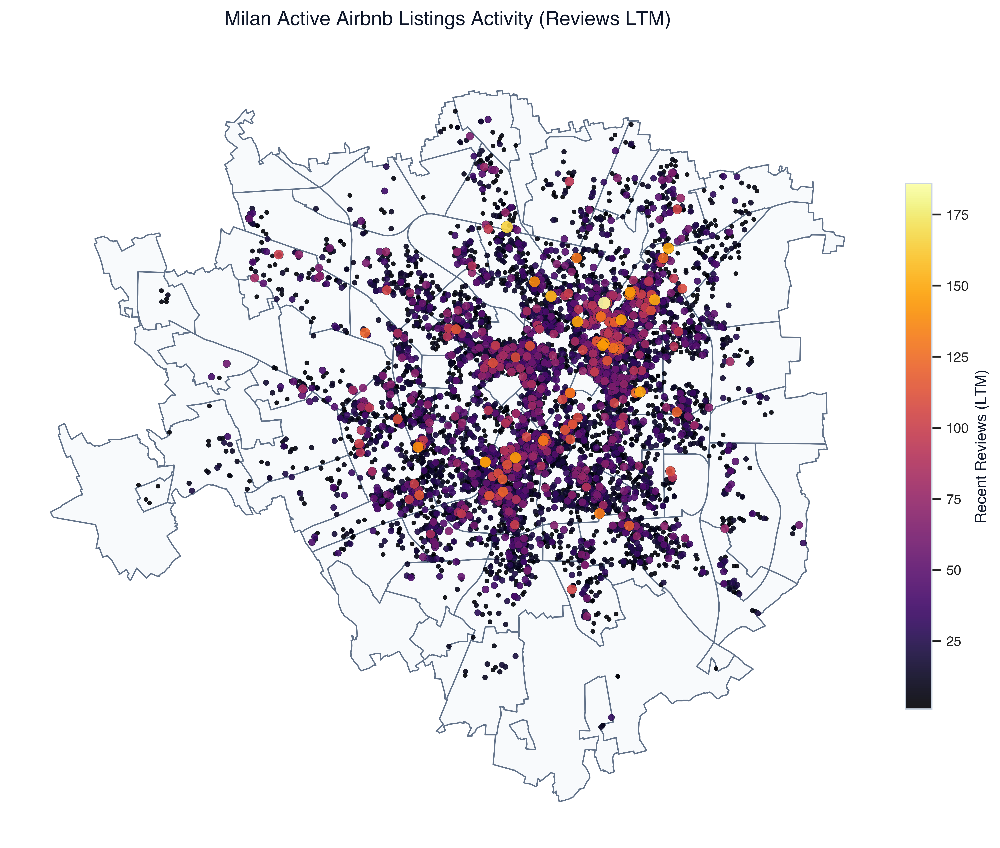

In [18]:
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd

if "df_clean" in globals() and "gdf_enriched" in globals():

  # Configurazione figura in alta definizione
  fig, ax = plt.subplots(figsize=(10, 10), dpi=300, facecolor="white")
  ax.set_facecolor("#ffffff")

  # 1. Sfondo dei quartieri pulito con confini marcati
  gdf_enriched.plot(
      ax=ax,
      color="#f8fafc",
      edgecolor="#64748b",
      linewidth=0.9,
      alpha=1.0,
  )

  
  df_map = df_clean.dropna(subset=["latitude", "longitude"]).copy()
  df_map = df_map[df_map["number_of_reviews_ltm"] > 0]

  if len(df_map) > 8000:
    df_map = df_map.sample(n=8000, random_state=42)


  df_map = df_map.sort_values("number_of_reviews_ltm", ascending=True)

  reviews = df_map["number_of_reviews_ltm"]
  max_rev = max(reviews.max(), 1)


  sizes = (reviews / max_rev) * 60 + 8

  sc = ax.scatter(
      df_map["longitude"],
      df_map["latitude"],
      s=sizes,
      c=reviews,
      cmap="inferno",  
      edgecolor="#0f172a",
      linewidth=0.15,
      alpha=0.9,
  )

 
  cbar = plt.colorbar(sc, ax=ax, shrink=0.5, pad=0.02)
  cbar.set_label(
      "Recent Reviews (LTM)", fontsize=10, fontweight="bold", color="#0f172a"
  )
  cbar.ax.tick_params(labelsize=9)

  ax.set_title(
      "Milan Active Airbnb Listings Activity (Reviews LTM)",
      fontsize=13,
      fontweight="bold",
      color="#0f172a",
      pad=20,
  )
  ax.axis("off")

  plt.tight_layout()
  plt.show()
else:
  print("Assicurati che 'df_clean' e 'gdf_enriched' siano caricati.")

## RQ3 To what extent are listings dominated by professional operators, and how does legal compliance vary across host types?



=== COMPLIANCE & LICENSE STATS BY HOST TYPE ===
                    host_category  total_listings  licensed_count  licensed_percentage
               1 Listing (Single)            8152            6952            85.279686
             2-5 Listings (Small)            4499            3980            88.464103
6+ Listings (Professional/Agency)            9980            9112            91.302605


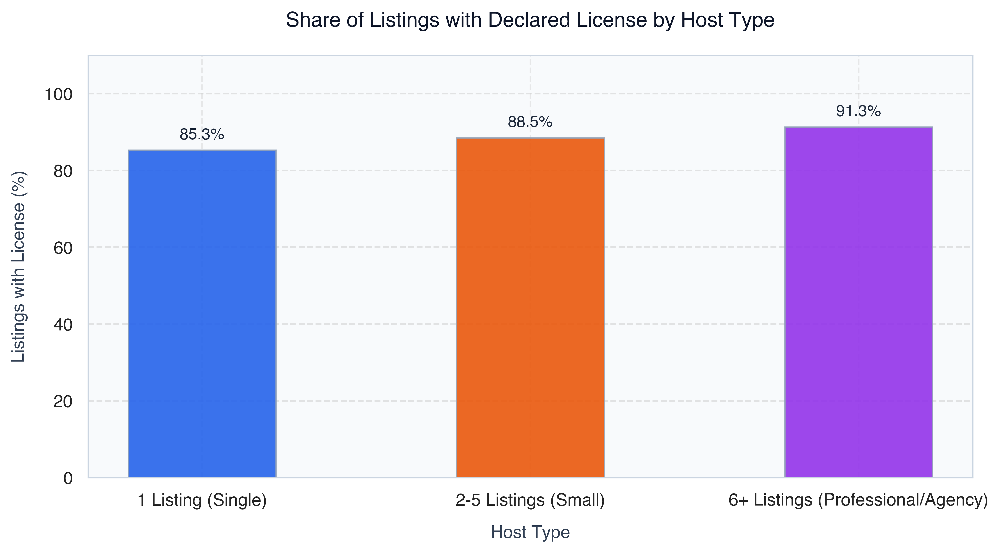

In [19]:

%config InlineBackend.figure_format = 'retina'

# --- STILE GRAFICO MODERN & CLEAN (SEABORN THEME) ---
sns.set_theme(style="whitegrid", palette="muted")
plt.rcParams["font.family"] = "sans-serif"
plt.rcParams["font.sans-serif"] = ["Helvetica", "Arial", "DejaVu Sans"]
plt.rcParams["axes.edgecolor"] = "#cbd5e1"
plt.rcParams["axes.linewidth"] = 0.8
plt.rcParams["grid.linestyle"] = "--"
plt.rcParams["grid.alpha"] = 0.4

if "df_clean" in globals():

  # 1. Verifica della colonna 'license'
  license_col = "license" if "license" in df_clean.columns else None

  if license_col:
    # Classificazione host portfolio
    def classify_host_size(count):
      if count == 1:
        return "1 Listing (Single)"
      elif 2 <= count <= 5:
        return "2-5 Listings (Small)"
      else:
        return "6+ Listings (Professional/Agency)"

    df_lic = df_clean.copy()
    df_lic["host_category"] = df_lic["calculated_host_listings_count"].apply(
        classify_host_size
    )

    # 2. Controllo licenza compilata (True/False)
    df_lic["has_license"] = df_lic["license"].notna() & (
        df_lic["license"].astype(str).str.strip() != ""
    )

    # 3. Tabella di riepilogo percentuale
    lic_summary = (
        df_lic.groupby("host_category")["has_license"]
        .agg(
            total_listings="count", licensed_count=lambda x: x.sum()
        )
        .reindex([
            "1 Listing (Single)",
            "2-5 Listings (Small)",
            "6+ Listings (Professional/Agency)",
        ])
        .reset_index()
    )

    lic_summary["licensed_percentage"] = (
        lic_summary["licensed_count"] / lic_summary["total_listings"]
    ) * 100

    print("=== COMPLIANCE & LICENSE STATS BY HOST TYPE ===")
    print(lic_summary.to_string(index=False))

    # 4. Visualizzazione con ax.bar per forzare i colori corretti (dpi=300)
    fig, ax = plt.subplots(figsize=(9, 5), dpi=300, facecolor="white")
    ax.set_facecolor("#f8fafc")  # Sfondo interno delicato

    # Palette di colori fissa e coerente con il secondo grafico
    custom_palette = ["#2563eb", "#ea580c", "#9333ea"]

    bars = ax.bar(
        lic_summary["host_category"],
        lic_summary["licensed_percentage"],
        color=custom_palette,
        width=0.45,
        edgecolor="#94a3b8",
        linewidth=0.8,
        alpha=0.9,
    )

    # Stile e formattazione assi
    ax.set_title(
        "Share of Listings with Declared License by Host Type",
        fontsize=13,
        fontweight="bold",
        color="#0f172a",
        pad=18,
    )
    ax.set_xlabel(
        "Host Type",
        fontsize=11,
        fontweight="semibold",
        color="#334155",
        labelpad=10,
    )
    ax.set_ylabel(
        "Listings with License (%)",
        fontsize=11,
        fontweight="semibold",
        color="#334155",
        labelpad=10,
    )
    ax.set_ylim(0, 110)  # Margine extra per le etichette in cima
    ax.grid(axis="y", linestyle="--", alpha=0.5)

    # Aggiunta automatica delle etichette percentuali sopra le barre
    for bar in bars:
      height = bar.get_height()
      if height > 0:
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            height + 2,
            f"{height:.1f}%",
            ha="center",
            va="bottom",
            fontsize=10,
            fontweight="bold",
            color="#1e293b",
        )

    plt.tight_layout()
    plt.show()

  else:
    print(
        "La colonna 'license' non è presente in questo specifico dataframe."
        " Assicurati di caricare il file 'listings.csv' dettagliato di Inside"
        " Airbnb."
    )
else:
  print("Assicurati che 'df_clean' sia caricato correttamente.")

=== COMPLIANCE & LICENSE STATS BY HOST TYPE ===
                    host_category  total_listings  licensed_count  licensed_percentage
               1 Listing (Single)            8152            6952            85.279686
             2-5 Listings (Small)            4499            3980            88.464103
6+ Listings (Professional/Agency)            9980            9112            91.302605


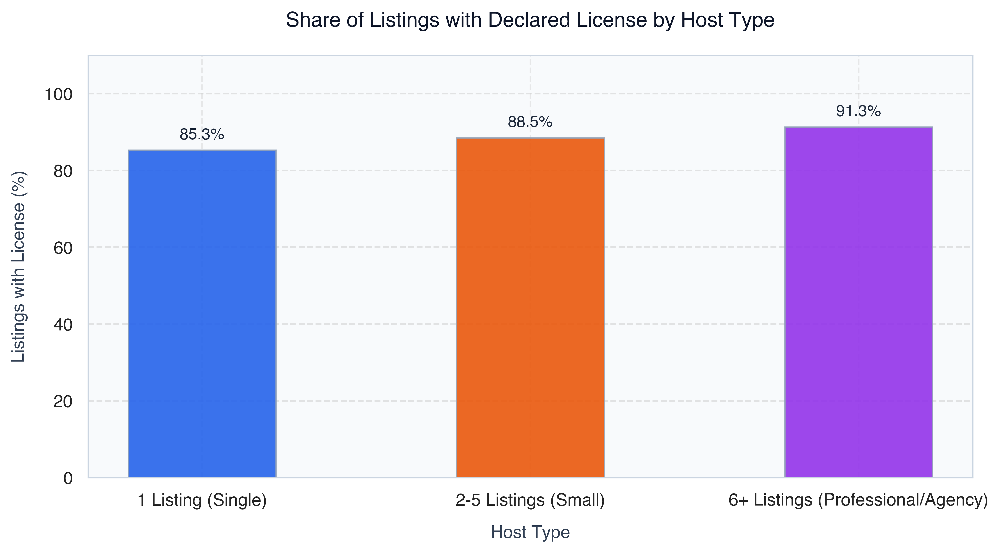

In [20]:

sns.set_theme(style="whitegrid", palette="muted")
plt.rcParams["font.family"] = "sans-serif"
plt.rcParams["font.sans-serif"] = ["Helvetica", "Arial", "DejaVu Sans"]
plt.rcParams["axes.edgecolor"] = "#cbd5e1"
plt.rcParams["axes.linewidth"] = 0.8
plt.rcParams["grid.linestyle"] = "--"
plt.rcParams["grid.alpha"] = 0.4

if "df_clean" in globals():

  
  license_col = "license" if "license" in df_clean.columns else None

  if license_col:
    
    def classify_host_size(count):
      if count == 1:
        return "1 Listing (Single)"
      elif 2 <= count <= 5:
        return "2-5 Listings (Small)"
      else:
        return "6+ Listings (Professional/Agency)"

    df_lic = df_clean.copy()
    df_lic["host_category"] = df_lic["calculated_host_listings_count"].apply(
        classify_host_size
    )

    
    df_lic["has_license"] = df_lic["license"].notna() & (
        df_lic["license"].astype(str).str.strip() != ""
    )

    
    lic_summary = (
        df_lic.groupby("host_category")["has_license"]
        .agg(
            total_listings="count", licensed_count=lambda x: x.sum()
        )
        .reindex([
            "1 Listing (Single)",
            "2-5 Listings (Small)",
            "6+ Listings (Professional/Agency)",
        ])
        .reset_index()
    )

    lic_summary["licensed_percentage"] = (
        lic_summary["licensed_count"] / lic_summary["total_listings"]
    ) * 100

    print("=== COMPLIANCE & LICENSE STATS BY HOST TYPE ===")
    print(lic_summary.to_string(index=False))

    
    fig, ax = plt.subplots(figsize=(9, 5), dpi=300, facecolor="white")
    ax.set_facecolor("#f8fafc")  

    
    custom_palette = ["#2563eb", "#ea580c", "#9333ea"]

    bars = ax.bar(
        lic_summary["host_category"],
        lic_summary["licensed_percentage"],
        color=custom_palette,
        width=0.45,
        edgecolor="#94a3b8",
        linewidth=0.8,
        alpha=0.9,
    )

    # Stile e formattazione assi
    ax.set_title(
        "Share of Listings with Declared License by Host Type",
        fontsize=13,
        fontweight="bold",
        color="#0f172a",
        pad=18,
    )
    ax.set_xlabel(
        "Host Type",
        fontsize=11,
        fontweight="semibold",
        color="#334155",
        labelpad=10,
    )
    ax.set_ylabel(
        "Listings with License (%)",
        fontsize=11,
        fontweight="semibold",
        color="#334155",
        labelpad=10,
    )
    ax.set_ylim(0, 110)  
    ax.grid(axis="y", linestyle="--", alpha=0.5)

   
    for bar in bars:
      height = bar.get_height()
      if height > 0:
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            height + 2,
            f"{height:.1f}%",
            ha="center",
            va="bottom",
            fontsize=10,
            fontweight="bold",
            color="#1e293b",
        )

    plt.tight_layout()
    plt.show()

  else:
    print(
        "The column 'license' is not present in this specific dataframe."
        " Make sure to load the 'listings.csv' detailed file from Inside"
        " Airbnb."
    )
else:
  print("Ensure that 'df_clean' is loaded correctly.")

## RQ4 How does the annual availability of listings differ between professional portfolios and districts throughout the urban context?


/var/folders/cb/l119vpqj3h3_mh82szqqb1080000gn/T/ipykernel_79831/2677396529.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


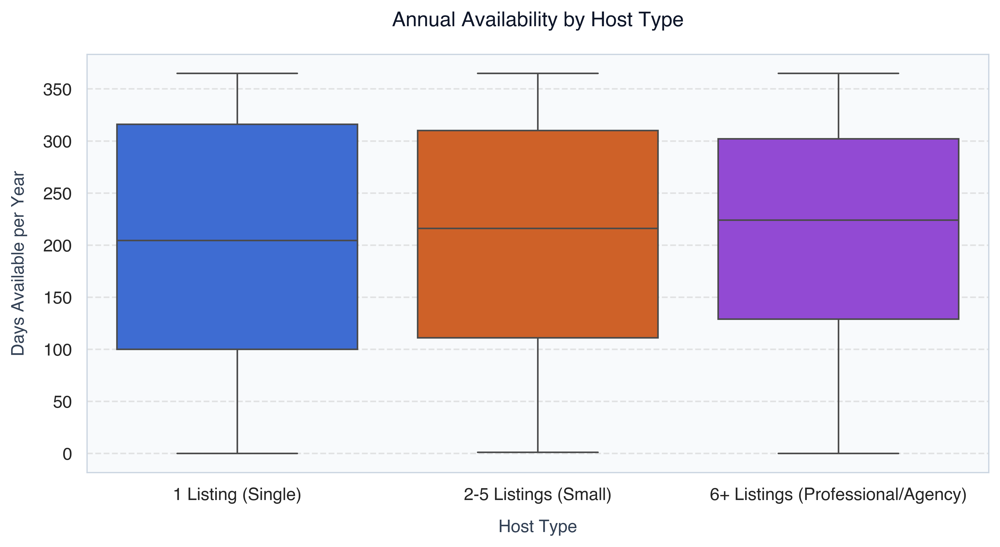

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns

if 'df_clean' in globals():
    
    # Assicuriamoci che la categoria host sia presente
    if 'host_category' not in df_clean.columns:
        def classify_host_size(count):
            if count == 1:
                return '1 Listing (Single)'
            elif 2 <= count <= 5:
                return '2-5 Listings (Small)'
            else:
                return '6+ Listings (Professional/Agency)'
        df_clean['host_category'] = df_clean['calculated_host_listings_count'].apply(classify_host_size)

    # Configurazione della figura singola in alta definizione (dpi=300)
    fig, ax = plt.subplots(figsize=(9, 5), dpi=300, facecolor='white')
    ax.set_facecolor('#f8fafc')
    
    sns.boxplot(
        data=df_clean,
        x='host_category',
        y='availability_365',
        palette=['#2563eb', '#ea580c', '#9333ea'],
        ax=ax,
        showfliers=False,
        linewidth=1.0
    )
    
    ax.set_title("Annual Availability by Host Type", fontsize=13, fontweight='bold', color='#0f172a', pad=18)
    ax.set_xlabel("Host Type", fontsize=11, fontweight='semibold', color='#334155', labelpad=10)
    ax.set_ylabel("Days Available per Year", fontsize=11, fontweight='semibold', color='#334155', labelpad=10)
    ax.grid(axis='y', linestyle='--', alpha=0.5)
    
    plt.tight_layout()
    plt.show()
else:
    print("Assicurati che 'df_clean' sia caricato correttamente.")

/var/folders/cb/l119vpqj3h3_mh82szqqb1080000gn/T/ipykernel_79831/841118505.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/cb/l119vpqj3h3_mh82szqqb1080000gn/T/ipykernel_79831/841118505.py:36: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=0, color='#334155', fontweight='semibold')


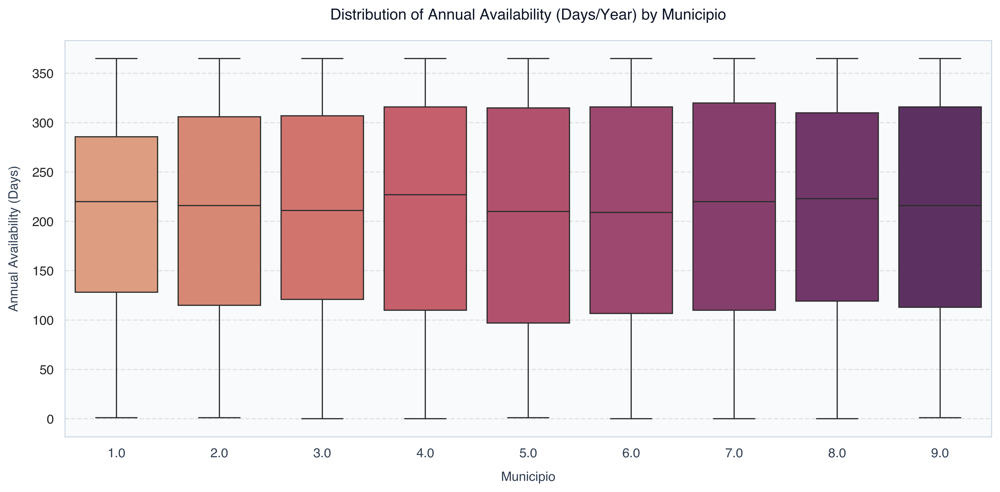

In [22]:

sns.set_theme(style="whitegrid", palette="muted")
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Helvetica', 'Arial', 'DejaVu Sans']
plt.rcParams['axes.edgecolor'] = '#cbd5e1'
plt.rcParams['axes.linewidth'] = 0.8
plt.rcParams['grid.linestyle'] = '--'
plt.rcParams['grid.alpha'] = 0.4

if 'df_clean' in globals() and 'municipio' in df_clean.columns and 'availability_365' in df_clean.columns:
    
    # 1. Filter out values greater than 365
    plot_data = df_clean[df_clean['availability_365'] <= 365].copy()
    
    # 2. Configurazione della figura in ALTA DEFINIZIONE (dpi=300)
    fig, ax = plt.subplots(figsize=(12, 6), dpi=300, facecolor='white')
    ax.set_facecolor('#f8fafc') # Sfondo interno delicato
    
    # 3. Create a clean vertical Box Plot con stile moderno
    sns.boxplot(
        data=plot_data,
        x='municipio',
        y='availability_365',
        palette='flare',  # Palette calda e professionale (alternativa a plasma)
        showfliers=False,  # Hides extreme outliers for a cleaner, compact look
        ax=ax,
        linewidth=1.0,
        fliersize=2
    )
    
    # 4. Styling e formattazione avanzata
    ax.set_title("Distribution of Annual Availability (Days/Year) by Municipio", fontsize=13, fontweight='bold', color='#0f172a', pad=18)
    ax.set_xlabel("Municipio", fontsize=11, fontweight='semibold', color='#334155', labelpad=10)
    ax.set_ylabel("Annual Availability (Days)", fontsize=11, fontweight='semibold', color='#334155', labelpad=10)
    ax.grid(axis='y', linestyle='--', alpha=0.5)
    
    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, color='#334155', fontweight='semibold')
    
    plt.tight_layout()
    plt.show()
else:
    print("Please ensure 'df_clean' is loaded and contains the 'municipio' and 'availability_365' columns.")

## (extra analysis)

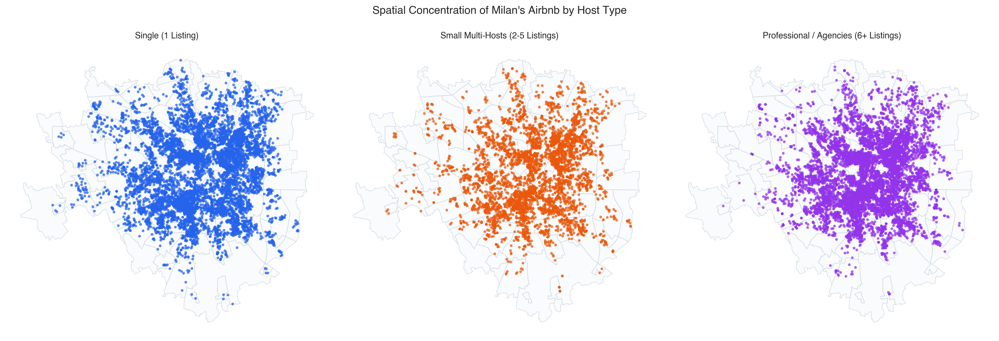

In [23]:


if 'df_clean' in globals() and 'latitude' in df_clean.columns and 'longitude' in df_clean.columns:
    
    # 1. Sostituisci 'milano_boundaries.geojson' con il nome esatto del tuo file GeoJSON
    geojson_path = 'neighbourhoods.geojson' 
    
    try:
        gdf_boundaries = gpd.read_file(geojson_path)
    except Exception as e:
        print(f"Errore nel caricamento del file GeoJSON: {e}")

    # 2. Classificazione della dimensione del portfolio host
    def classify_host_size(count):
        if count == 1:
            return '1 Listing (Single)'
        elif 2 <= count <= 5:
            return '2-5 Listings (Small)'
        else:
            return '6+ Listings (Professional/Agency)'

    df_map = df_clean.copy()
    df_map['host_category'] = df_map['calculated_host_listings_count'].apply(classify_host_size)
    
    gdf_listings = gpd.GeoDataFrame(
        df_map, 
        geometry=gpd.points_from_xy(df_map['longitude'], df_map['latitude']),
        crs="EPSG:4326"
    )
    
    if gdf_boundaries.crs != "EPSG:4326":
        gdf_boundaries = gdf_boundaries.to_crs("EPSG:4326")

    # 3. Configurazione dei 3 pannelli affiancati (1 riga, 3 colonne)
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    categories = [
        ('1 Listing (Single)', '#2563eb', 'Single (1 Listing)'),
        ('2-5 Listings (Small)', '#ea580c', 'Small Multi-Hosts (2-5 Listings)'),
        ('6+ Listings (Professional/Agency)', '#9333ea', 'Professional / Agencies (6+ Listings)')
    ]
    
    # 4. Creazione delle mappe con punti precisi e definiti
    for i, (category, color, title) in enumerate(categories):
        ax = axes[i]
        
        # Sfondo dei confini pulito
        gdf_boundaries.plot(
            ax=ax, 
            color='#f8fafc', 
            edgecolor='#cbd5e1', 
            linewidth=0.7,
            alpha=0.8
        )
        
        # Filtra e plotta con punti nitidi e precisi
        subset = gdf_listings[gdf_listings['host_category'] == category]
        subset.plot(
            ax=ax,
            color=color,
            markersize=12,      # Dimensione precisa per vedere i singoli punti e i cluster
            alpha=0.75,         # Buona opacità per distinguere i dettagli senza sgranare
            marker='o',
            edgecolor='none'
        )
        
        # Titolo del pannello
        ax.set_title(title, fontsize=11, fontweight='bold', pad=10)
        ax.axis('off')
    
    # 5. Titolo generale e layout
    plt.suptitle("Spatial Concentration of Milan's Airbnb by Host Type", fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()
else:
    print("Ensure that 'df_clean' is loaded correctly.")

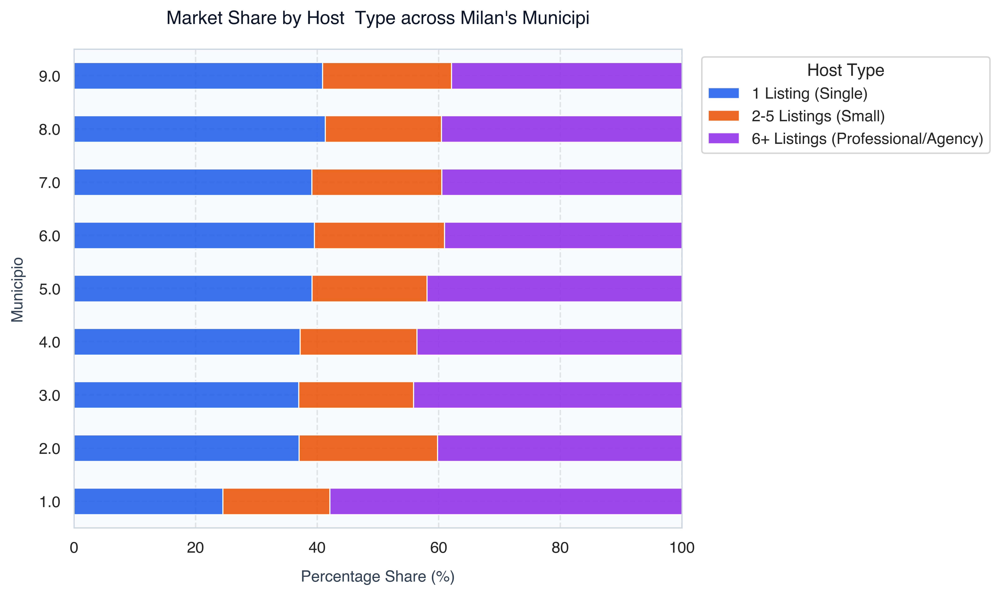

In [24]:


# --- STILE GRAFICO MODERN & CLEAN (SEABORN THEME) ---
sns.set_theme(style="whitegrid", palette="muted")
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Helvetica', 'Arial', 'DejaVu Sans']
plt.rcParams['axes.edgecolor'] = '#cbd5e1'
plt.rcParams['axes.linewidth'] = 0.8
plt.rcParams['grid.linestyle'] = '--'
plt.rcParams['grid.alpha'] = 0.4

if 'df_clean' in globals() and 'municipio' in df_clean.columns:
    
    # 1. Classificazione host
    def classify_host_size(count):
        if count == 1:
            return '1 Listing (Single)'
        elif 2 <= count <= 5:
            return '2-5 Listings (Small)'
        else:
            return '6+ Listings (Professional/Agency)'

    df_analysis = df_clean.copy()
    df_analysis['host_category'] = df_analysis['calculated_host_listings_count'].apply(classify_host_size)
    
    # 2. Crea la tabella pivot con le percentuali per Municipio
    pivot_table = pd.pivot_table(
        df_analysis,
        index='municipio',
        columns='host_category',
        values='id',
        aggfunc='count',
        fill_value=0
    )
    
    # Converte in percentuali (somma di riga = 100%)
    pivot_pct = pivot_table.div(pivot_table.sum(axis=1), axis=0) * 100
    
    # Riordina le colonne per coerenza cromatica
    cols_order = ['1 Listing (Single)', '2-5 Listings (Small)', '6+ Listings (Professional/Agency)']
    pivot_pct = pivot_pct[cols_order]
    
    # 3. Configurazione della figura in ALTA DEFINIZIONE (dpi=300)
    fig, ax = plt.subplots(figsize=(10, 6), dpi=300, facecolor='white')
    ax.set_facecolor('#f8fafc') # Sfondo interno delicato
    
    # Palette di colori ad alto contrasto coerente
    colors = ['#2563eb', '#ea580c', '#9333ea'] # Blu, Arancione, Viola
    
    # Grafico a barre orizzontali impilate tramite pandas/matplotlib con stile pulito
    pivot_pct.plot(
        kind='barh',
        stacked=True,
        color=colors,
        ax=ax,
        edgecolor='#ffffff',
        linewidth=0.8,
        alpha=0.9
    )
    
    # 4. Formattazione e stile avanzato
    ax.set_title("Market Share by Host  Type across Milan's Municipi", fontsize=13, fontweight='bold', color='#0f172a', pad=18)
    ax.set_xlabel("Percentage Share (%)", fontsize=11, fontweight='semibold', color='#334155', labelpad=10)
    ax.set_ylabel("Municipio", fontsize=11, fontweight='semibold', color='#334155', labelpad=10)
    ax.set_xlim(0, 100)
    ax.grid(axis='x', linestyle='--', alpha=0.5)
    
    # Posiziona la legenda in modo pulito fuori dal grafico
    legend = ax.legend(title="Host Type", bbox_to_anchor=(1.02, 1), loc='upper left', frameon=True, facecolor='white')
    legend.get_title().set_fontweight('bold')
    
    plt.tight_layout()
    plt.show()
else:
    print("Assicurati che 'df_clean' sia caricato e contenga la colonna 'municipio'.")

=== ROOM TYPE DISTRIBUTION BY HOST TYPE (%) ===
room_type                          Entire home/apt  Hotel room  Private room  Shared room
host_category                                                                            
1 Listing (Single)                           89.74        0.00         10.16         0.10
2-5 Listings (Small)                         79.80        0.13         19.74         0.33
6+ Listings (Professional/Agency)            92.03        0.20          7.42         0.34


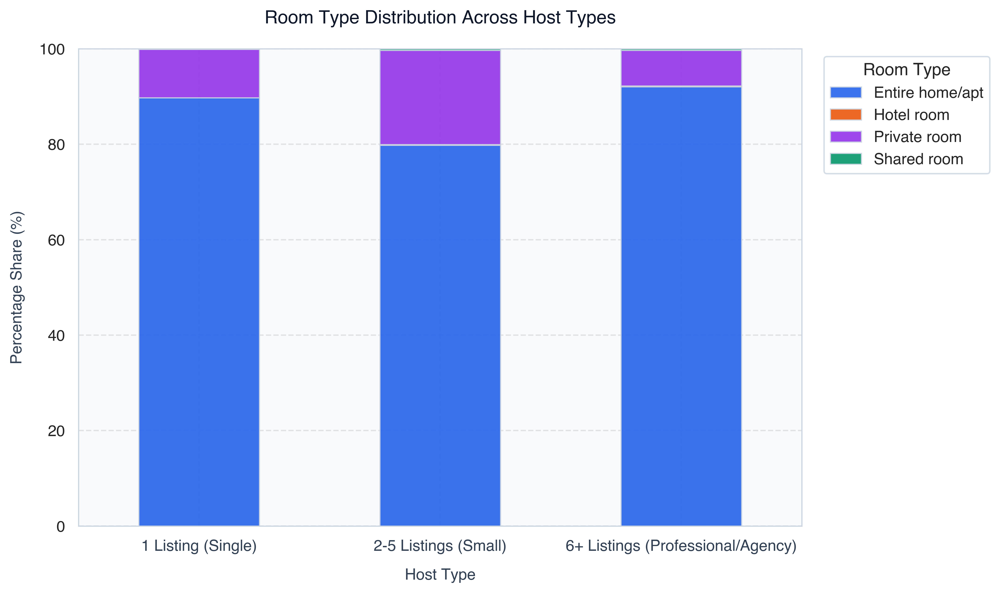

In [25]:

if 'df_clean' in globals():
    
    # 1. Assicuriamoci che la categoria host sia presente
    if 'host_category' not in df_clean.columns:
        def classify_host_size(count):
            if count == 1:
                return '1 Listing (Single)'
            elif 2 <= count <= 5:
                return '2-5 Listings (Small)'
            else:
                return '6+ Listings (Professional/Agency)'
        df_clean['host_category'] = df_clean['calculated_host_listings_count'].apply(classify_host_size)

    # 2. Crea una tabella di contingenza (cross-tabulation) tra Host Type e Room Type
    room_host_xtab = pd.crosstab(
        df_clean['host_category'], 
        df_clean['room_type'], 
        normalize='index'
    ) * 100  # Convertito in percentuale

    # Riordiniamo le categorie degli host per coerenza con i grafici precedenti
    desired_order = [
        '1 Listing (Single)', 
        '2-5 Listings (Small)', 
        '6+ Listings (Professional/Agency)'
    ]
    room_host_xtab = room_host_xtab.reindex([cat for cat in desired_order if cat in room_host_xtab.index])

    print("=== ROOM TYPE DISTRIBUTION BY HOST TYPE (%) ===")
    print(room_host_xtab.round(2).to_string())

    # 3. Visualizzazione con 100% Stacked Bar Chart in alta definizione (dpi=300)
    fig, ax = plt.subplots(figsize=(10, 6), dpi=300, facecolor='white')
    ax.set_facecolor('#f8fafc')

    # Palette di colori coordinata per i room types
    room_palette = ['#2563eb', '#ea580c', '#9333ea', '#059669'] # Adattata al numero di room types presenti
    
    room_host_xtab.plot(
        kind='bar',
        stacked=True,
        ax=ax,
        color=room_palette[:len(room_host_xtab.columns)],
        edgecolor='#cbd5e1',
        linewidth=0.8,
        alpha=0.9
    )

    # Formattazione del grafico
    ax.set_title("Room Type Distribution Across Host Types", fontsize=13, fontweight='bold', color='#0f172a', pad=18)
    ax.set_xlabel("Host Type", fontsize=11, fontweight='semibold', color='#334155', labelpad=10)
    ax.set_ylabel("Percentage Share (%)", fontsize=11, fontweight='semibold', color='#334155', labelpad=10)
    ax.set_ylim(0, 100)
    ax.grid(axis='y', linestyle='--', alpha=0.5)
    
    # Rotazione delle etichette sull'asse x per leggibilità
    plt.xticks(rotation=0, fontweight='semibold', color='#334155')
    
    # Legenda pulita fuori o dentro il grafico
    ax.legend(title="Room Type", bbox_to_anchor=(1.02, 1), loc='upper left', frameon=True, facecolor='white', edgecolor='#cbd5e1')

    plt.tight_layout()
    plt.show()
else:
    print("Assicurati che 'df_clean' sia caricato correttamente.")